In [13]:
#Import libraries 

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import time 
%matplotlib inline
import pprint

In [2]:
df = pd.read_csv('IBM-HR-Employee-Attrition.csv')

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
print(df.head(5))

   Age Attrition     BusinessTravel  DailyRate              Department  \
0   41       Yes      Travel_Rarely       1102                   Sales   
1   49        No  Travel_Frequently        279  Research & Development   
2   37       Yes      Travel_Rarely       1373  Research & Development   
3   33        No  Travel_Frequently       1392  Research & Development   
4   27        No      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  EmployeeCount  EmployeeNumber  \
0                 1          2  Life Sciences              1               1   
1                 8          1  Life Sciences              1               2   
2                 2          2          Other              1               4   
3                 3          4  Life Sciences              1               5   
4                 2          1        Medical              1               7   

   EnvironmentSatisfaction  Gender  HourlyRate  JobInvolvement  JobLevel  

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EmployeeCount               1470 non-null int64
EmployeeNumber              1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome         

In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [6]:
print("Number missing:", df.isnull().sum().sum())

Number missing: 0


Insights about features 

EmployeeCount and StndardHours have constant values and are not useful for analysis. 

Education, EnvironmentSatisfaction, JobInvolvement, JobSatisfaction, PerformanceRating, RelationshipSatisfaction, WorkLifeBalance are ordinal variables where higher values are better. 



In [5]:
df.drop(['EmployeeCount', 'StandardHours', 'Over18'], axis=1, inplace = True)
features = [x for x in df.columns if x not in ['EmployeeNumber','Attrition']]
cat_features = [x for x in df.select_dtypes(include =['object']).columns if x not in ['EmployeeNumber','Attrition']]
num_features = [x for x in df.select_dtypes(exclude =['object']).columns if x not in ['EmployeeNumber','Attrition']]
target = df['Attrition']

print('Categorical:',cat_features)
print('Numeric:',num_features)

Categorical: ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']
Numeric: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


# Exploring Target 

<AxesSubplot:xlabel='Attrition', ylabel='count'>

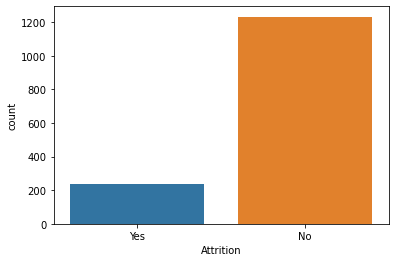

In [5]:
sns.countplot(x=target)

In [19]:
print("Attrition (Number of employees)")
target.value_counts() 

Attrition (Number of employees)


No     1233
Yes     237
Name: Attrition, dtype: int64

In [6]:
print("Attrition (Percentage of employees)")
(target.value_counts() / target.shape[0]) * 100

Attrition (Percentage of employees)


No     83.877551
Yes    16.122449
Name: Attrition, dtype: float64

### This is an imbalanced dataset 

In [7]:
df['Attrition'] = df.Attrition.map(dict(Yes = 1, No = 0))
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


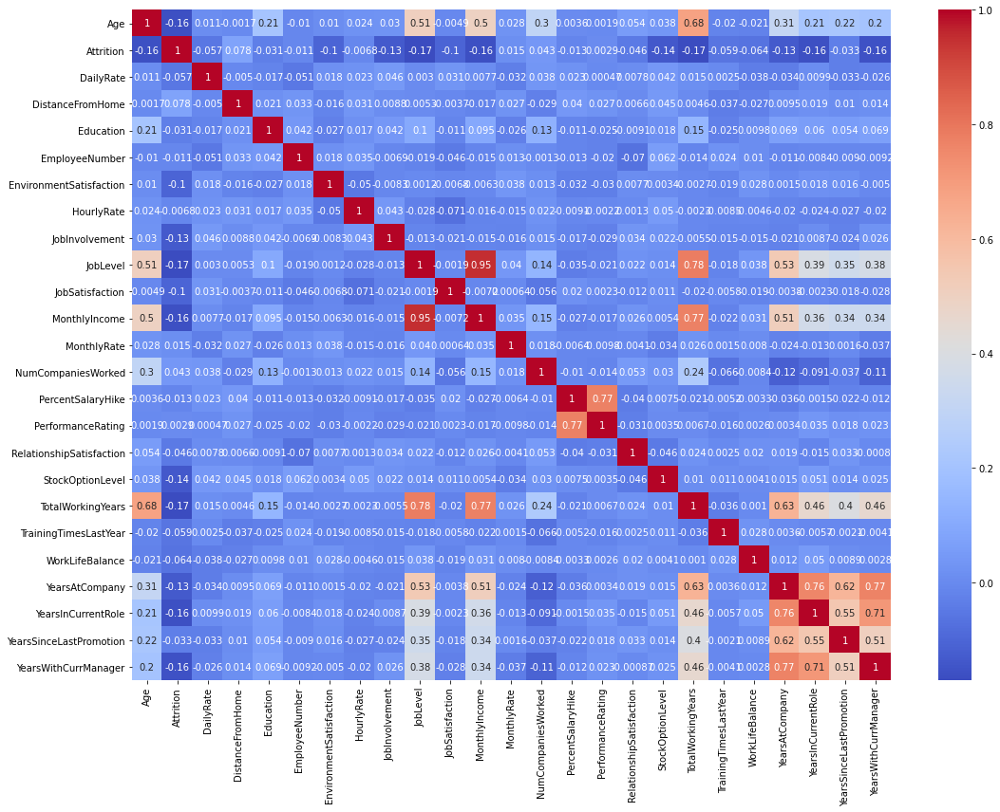

In [8]:
plt.figure(figsize=(16,12))
sns.heatmap(df.corr(method='pearson'), cmap='coolwarm',annot =True)
plt.tight_layout()

In [109]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

df1 = df[num_features]

Xdf = add_constant(df1)
vif = pd.Series([variance_inflation_factor(Xdf.values, i) for i in range(Xdf.shape[1])], index=Xdf.columns)
vif.sort_values()

TrainingTimesLastYear         1.009917
EnvironmentSatisfaction       1.010099
MonthlyRate                   1.012282
JobSatisfaction               1.014511
WorkLifeBalance               1.014884
DistanceFromHome              1.015515
RelationshipSatisfaction      1.015771
JobInvolvement                1.016316
StockOptionLevel              1.017682
DailyRate                     1.018198
HourlyRate                    1.018318
Education                     1.059352
NumCompaniesWorked            1.257737
YearsSinceLastPromotion       1.674278
Age                           2.044890
PerformanceRating             2.513734
PercentSalaryHike             2.516385
YearsInCurrentRole            2.718604
YearsWithCurrManager          2.774587
YearsAtCompany                4.587391
TotalWorkingYears             4.767796
MonthlyIncome                10.800070
JobLevel                     11.205067
const                       202.093542
dtype: float64

<IPython.core.display.Javascript object>


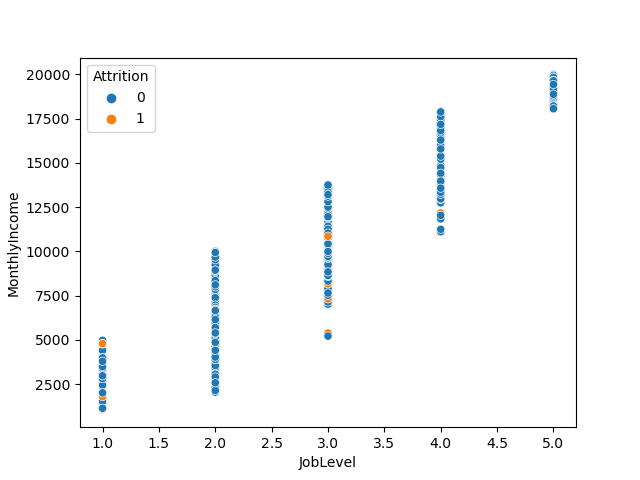

<AxesSubplot:xlabel='JobLevel', ylabel='MonthlyIncome'>

In [8]:
sns.scatterplot(data = df, x = df.JobLevel , y = df.MonthlyIncome, hue= df.Attrition )

Job level is highly correlated with monthly income which makes sense. The vif value suggests that multicollinearity exists between these two variables. However, since Monthly income is continuous and Job level is ordinal, I am going to keep both the variables in the data set. 

Yearsatcompany, yearsincurrentrole, yearssincelastpromotion, years with currentmanager are all quite correlated with each other. The vif values are however lower than the thumb rule of 5 or 10, suggesting multicollinearity will not be an issue here. 

<AxesSubplot:>

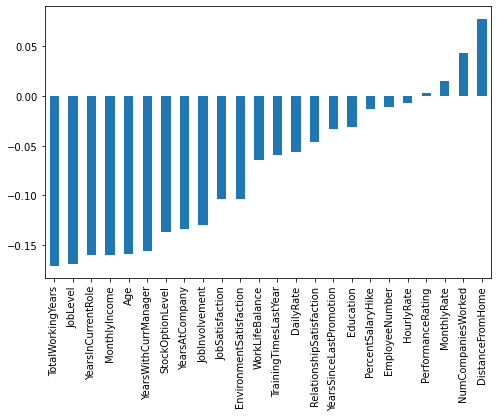

In [34]:
plt.figure(figsize = (8,5))
df.corr(method='pearson')['Attrition'].sort_values()[:-1].plot(kind='bar')

### Correlation with Attrition

Considering Attrition as 0,1 gives us some insight into which numerical variables might be correlated with Attrition. 
Weak correlation is seen between Attrition and following variables, 
Age, Job level, Monthly income, Environment and Job satisfaction, Stock option level, Total working years, Years at company, in current role and with current manager. 

<AxesSubplot:xlabel='Age', ylabel='MonthlyIncome'>

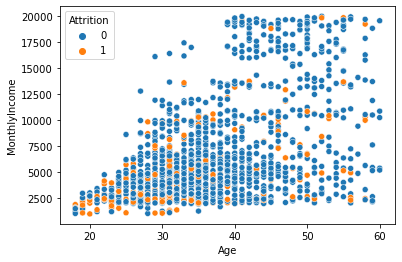

In [20]:
sns.scatterplot(data = df, x = df.Age , y = df.MonthlyIncome, hue= df.Attrition )

<IPython.core.display.Javascript object>


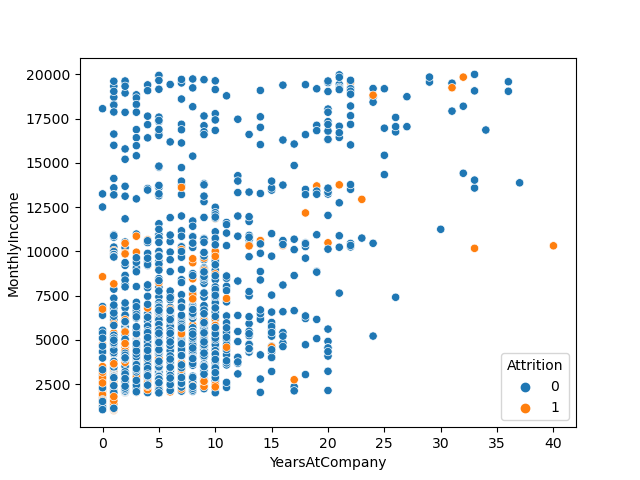

<AxesSubplot:xlabel='YearsAtCompany', ylabel='MonthlyIncome'>

In [9]:
sns.scatterplot(data = df, x = df.YearsAtCompany , y = df.MonthlyIncome, hue= df.Attrition )

<IPython.core.display.Javascript object>


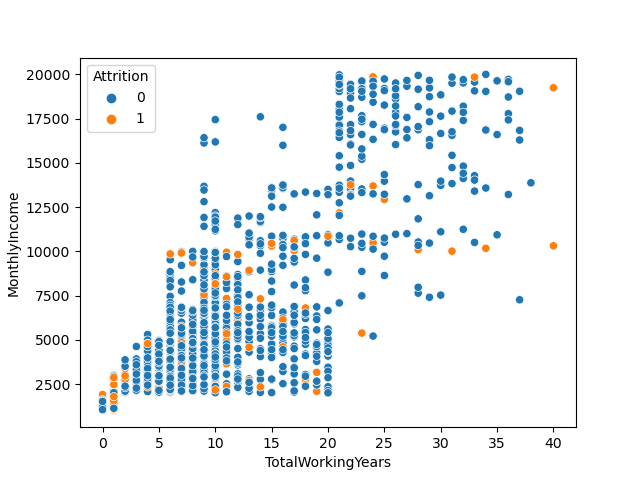

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='MonthlyIncome'>

In [10]:
sns.scatterplot(data = df, x = df.TotalWorkingYears , y = df.MonthlyIncome, hue= df.Attrition )

### How do the two groups compare across variables? 

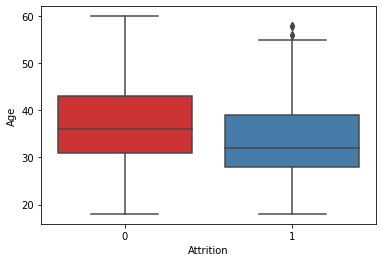

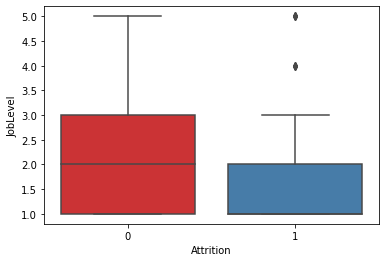

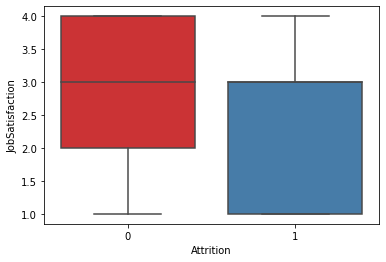

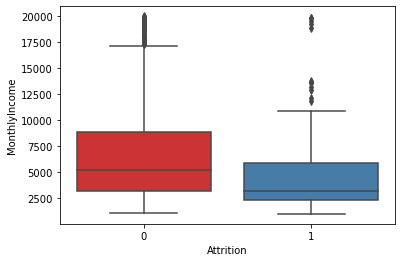

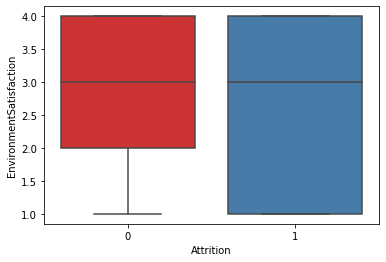

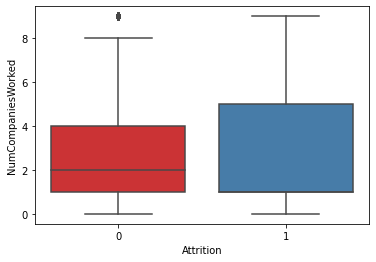

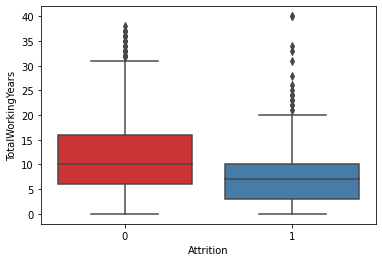

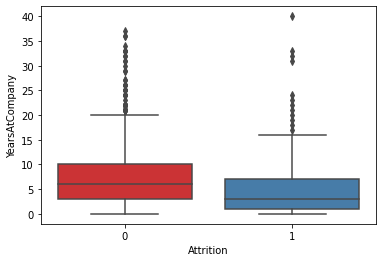

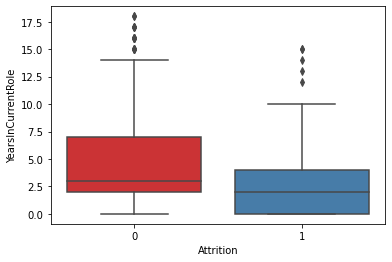

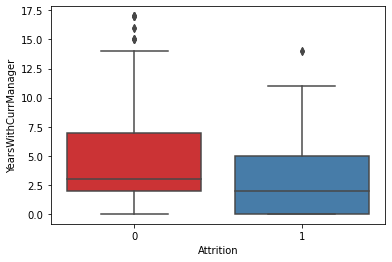

In [15]:
pltfeat = ['Age', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome','EnvironmentSatisfaction',
           'NumCompaniesWorked', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

for num in pltfeat:
    sns.boxplot(data = df, x = df.Attrition, y = df[num] ,palette='Set1')
    plt.show()


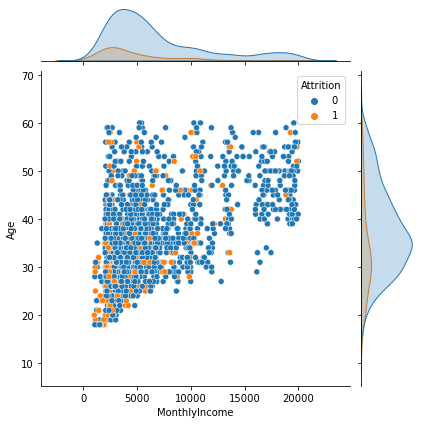

In [112]:
sns.jointplot(data=df, x = df.MonthlyIncome, y = df.Age, hue = df.Attrition)

#### Comparing the two groups (Attrition = 0 or 1), we see that,  the group with Attrition = 1 has lower median age and lower median monthly income as compared to the Attrition =0 group. The job level and Job satisfaction is lower in Attrition = 1 group as compared to Attrition = 0.   

In [118]:
cat_features

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

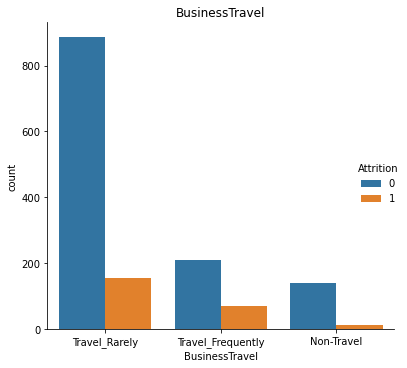

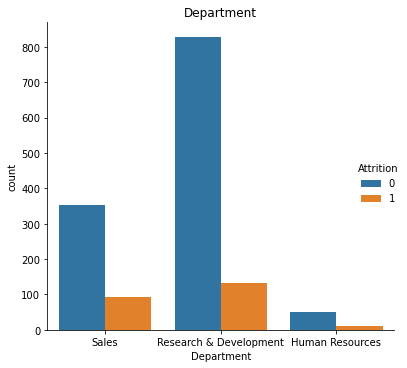

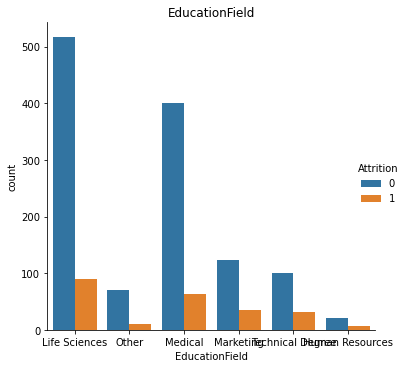

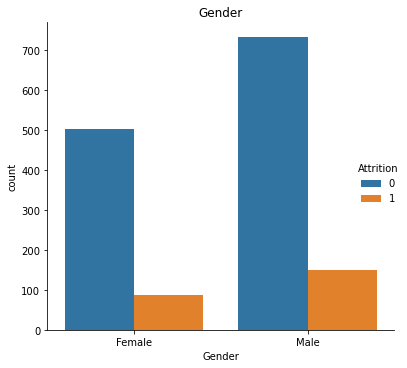

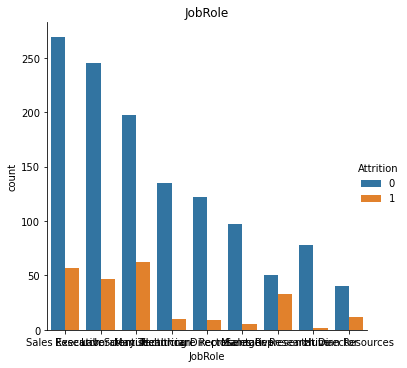

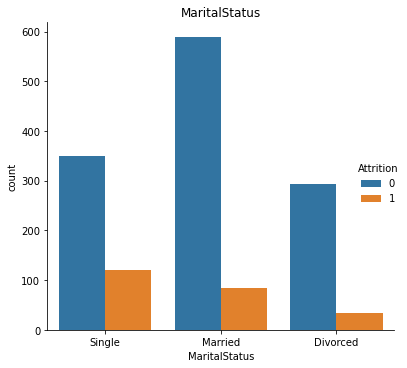

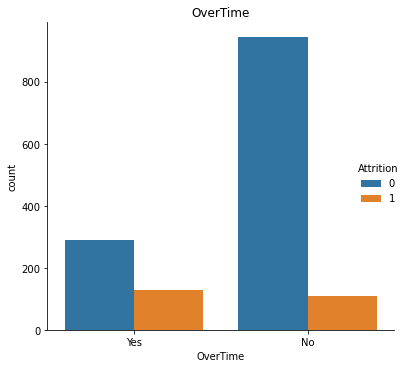

In [20]:
for cat in cat_features:
    sns.catplot(data = df , x=cat ,hue="Attrition", kind="count")
    plt.tight_layout()
    plt.title(cat)
    plt.show()

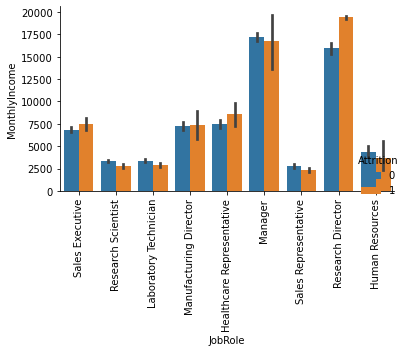

In [21]:
sns.catplot(data = df , x="JobRole", y = "MonthlyIncome" ,hue="Attrition", kind="bar")
plt.xticks(rotation = 90) 
plt.tight_layout()

#### People in the sales representative job role have a higher attrition rate as compared to other job roles.  

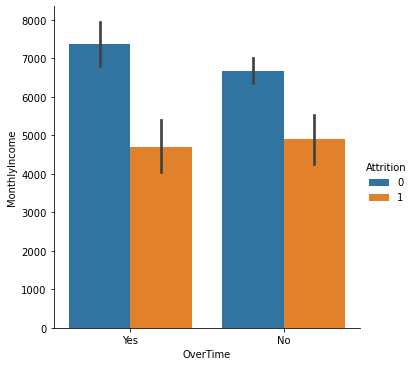

In [136]:
sns.catplot(data = df , x="OverTime", y = "MonthlyIncome" ,hue="Attrition", kind="bar")

#### The above plot shows that in the Attrition = 0 group, those who do overtime have higher monthly income than those who do not. However, in the Attrition = 1 group, this does not hold true, the monthly income is similar whether you do over time or not. 

In [4]:
from scipy.stats import chi2_contingency
for cat in cat_features:
    # Contingency table.
    contingency = pd.crosstab(df[cat], df['Attrition'])

    # Chi-square test of independence.
    c, p, dof, expected = chi2_contingency(contingency)
    if p <= 0.05:
        print (cat,round(p,4), "Dependent")
    else:
        print(cat,round(p,4), "Independent")

BusinessTravel 0.0 Dependent
Department 0.0045 Dependent
EducationField 0.0068 Dependent
Gender 0.2906 Independent
JobRole 0.0 Dependent
MaritalStatus 0.0 Dependent
OverTime 0.0 Dependent


The chi-square contingency tests show that there is no relation between gender and attrition. 

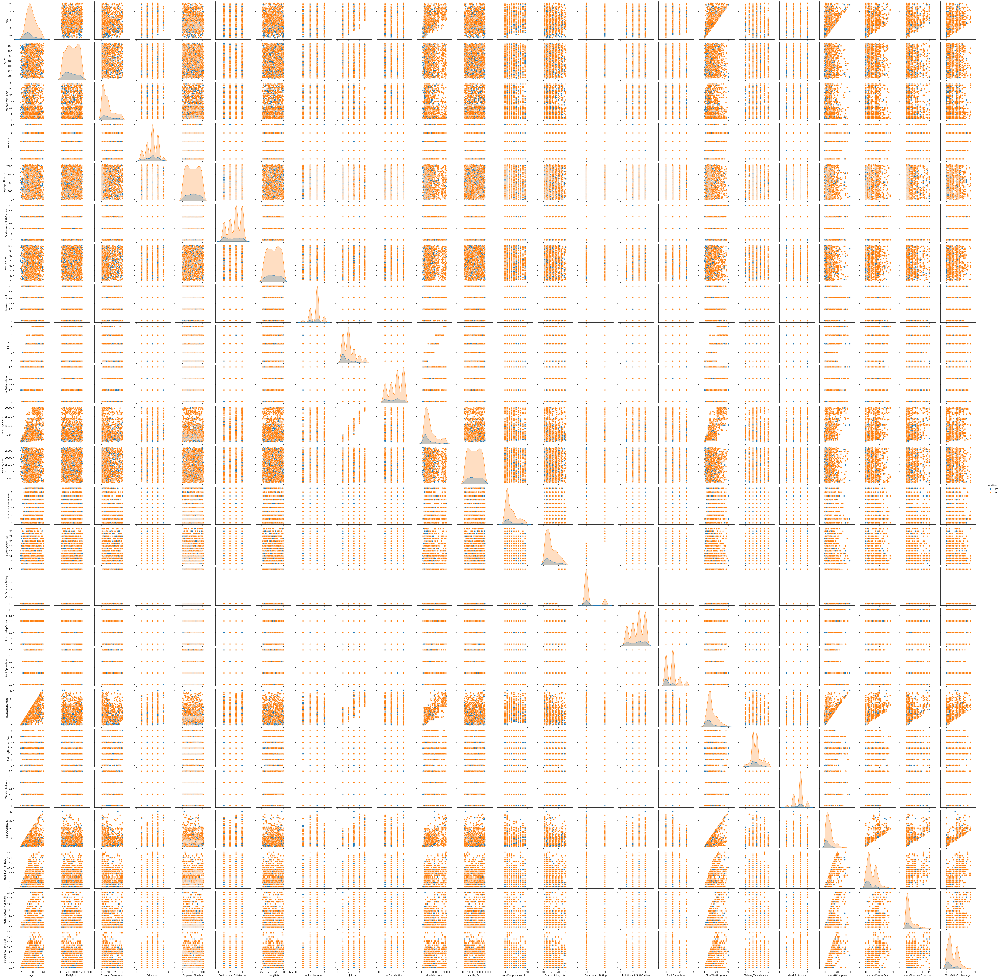

In [11]:
sns.pairplot(df, hue = 'Attrition')

Distribution of Job level, Job satisfaction and Monthly income differs between the two groups (Atttrition = 0 or 1).

In [12]:
df.Attrition.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [23]:
df0 = df[df['Attrition'] == 0]
df1 = df[df['Attrition'] == 1]
print(df0.shape, df1.shape)

(1233, 32) (237, 32)


### Pair plot after under-sampling

In [24]:
#current ratio of 1's to 0's is 5.2, lets try a 1:1 ratio to explore the relationships between different variables
df0_under = df0.sample(df1.shape[0])
df_under = pd.concat([df0_under, df1], axis=0)

print('Random under-sampling:')
print(df_under.Attrition.value_counts())

Random under-sampling:
1    237
0    237
Name: Attrition, dtype: int64


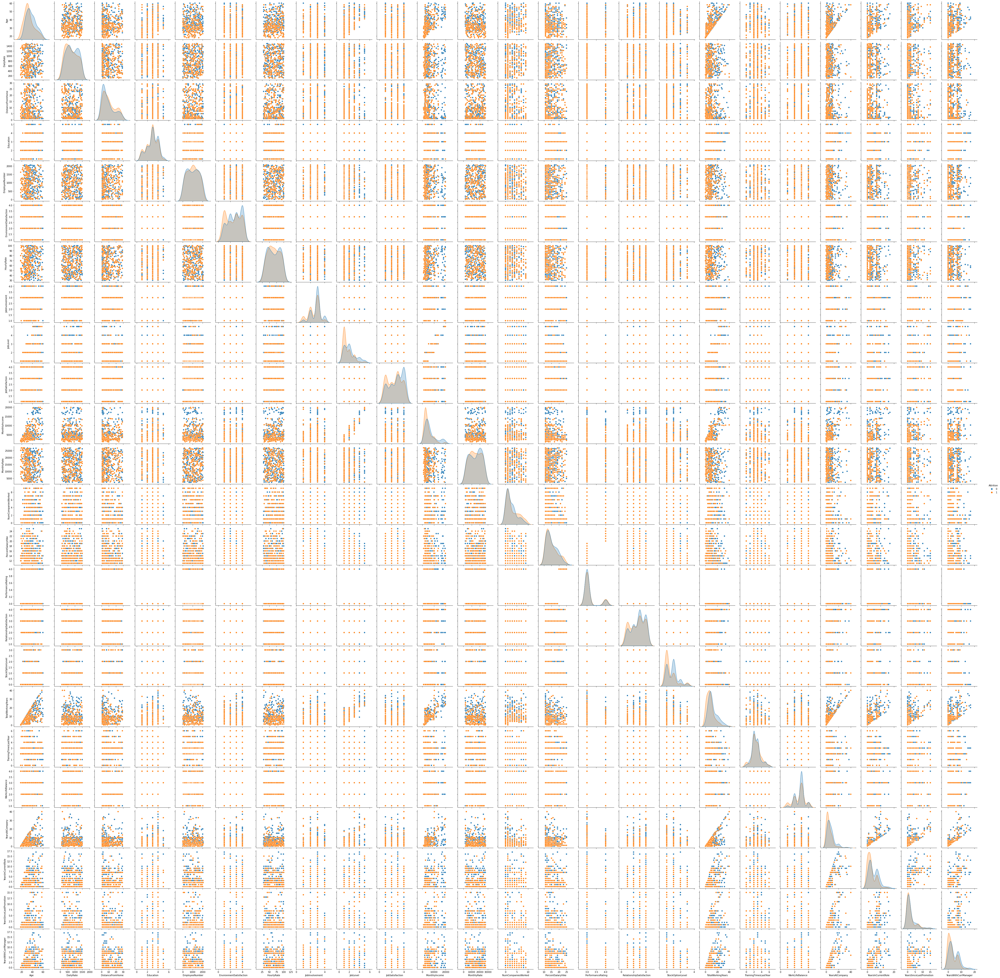

In [25]:
sns.pairplot(df_under, hue = 'Attrition')

Job satisfaction, Stock option level also seems to differ between the two groups. 